# USP - EACH - SIN5007 - Reconhecimento de Padrões
## Grupo H/8 - Atividade 03 - PCA
### Tratamento do Arquivo Total SPHARM

### 1) Abertura do Arquivo

In [1]:
# Importando e abrindo o arquivo
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

dy = pd.read_csv('Total_SPHARM_20200403.csv', header=None)

print(f'Nome do Arquivo: Total_SPHARM_20200403.csv')
print(f'Estrutura do arquivo: \nQuantidade de linhas: {dy.shape[0]} \nQuantidade de Características: {dy.shape[1]}')
dy.head()

Nome do Arquivo: Total_SPHARM_20200403.csv
Estrutura do arquivo: 
Quantidade de linhas: 400 
Quantidade de Características: 196


,0,1,2,3,4,5,6,7,8,9,...,186,187,188,189,190,191,192,193,194,195
0,29.0,0.0,1.0,-7881.480247,-5759.969698,-24465.608592,-15275.106756,-22974.378070,-22686.138288,-6131.488463,...,-12496.857522,-22848.427731,-22691.010230,-7827.717382,-2263.959217,-3822.863214,-22098.019430,-9560.519051,-16471.554891,0.0
1,31.0,0.0,1.0,-567.772697,-33.292309,-465.179132,-525.981010,-469.546900,-305.182676,-89.243364,...,-371.460326,-293.878270,-858.115037,-82.880537,-1261.923377,-505.496612,-359.869248,-440.017967,-389.978955,0.0
2,27.0,0.0,1.0,-135372.767326,-115124.114646,-772665.053883,-292331.423079,-58059.255010,-118464.329594,-585147.837935,...,-361416.242692,-802108.789114,-342903.434410,-415532.701394,-408822.864411,-518190.767499,-730640.209508,-199785.389230,-546781.070932,0.0
3,52.0,0.0,1.0,-582.939571,-366.425893,-281.022452,-437.739821,-206.814933,-230.346112,-126.535277,...,-522.086637,-233.030710,-551.587639,-413.616578,-66.132582,-811.608167,-621.620823,-488.389220,-300.572949,0.0
4,56.0,0.0,1.0,-913.082501,-334.221895,-449.102108,-113.637478,-50.065343,-127.180338,-640.351614,...,-115.257538,-388.055205,-291.527838,-380.295832,-166.020393,-3.073603,-119.535497,-304.138510,-212.377888,0.0


### 2) Análise Comparativa - Idade x Variável Alvo
Vamos plotar a variação da idade em relação a variável alvo. Isto mostrará a distribuição das idades pelas três classes.

Text(0.5, 1.0, 'Distribuição das Idades por Classe')

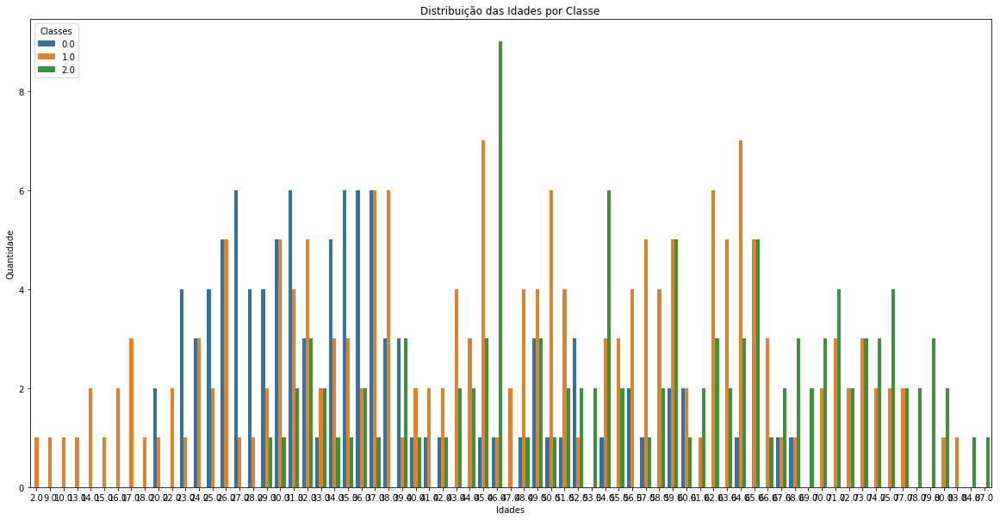

In [2]:
plt.figure(figsize=(20, 10))
ax = sns.countplot(x=0, hue=195 ,data=dy)
plt.xlabel('Idades')
plt.ylabel('Quantidade')
plt.legend(loc='upper left', title='Classes')
ax.set_title('Distribuição das Idades por Classe')    

Apesar de um suposta curva normal, verificamos que em algumas idades temos somente a ocorrência de uma classe.

Por exemplo, temos na idade de 2 anos somente uma ocorrência da classe 1

### 3) Análise Comparativa - Sexo x Variável Alvo
Vamos plotar a variação do sexo em relação a variável alvo. Isto mostrará a distribuição dos sexos pelas três classes.

Text(0.5, 1.0, 'Distribuição das Sexos por Classe')

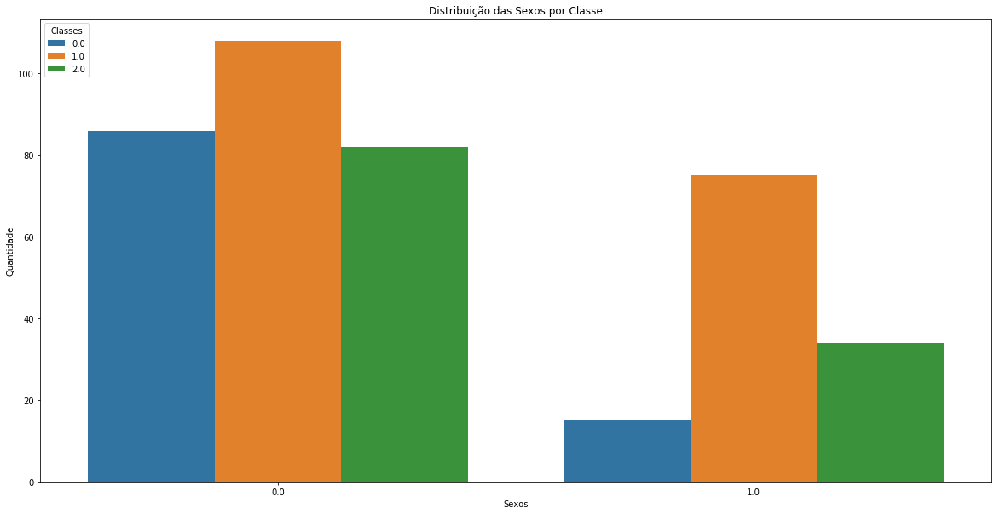

In [12]:
plt.figure(figsize=(20, 10))
ax = sns.countplot(x=1, hue=195 ,data=dy)
plt.xlabel('Sexos')
plt.ylabel('Quantidade')
plt.legend(loc='upper left', title='Classes')
plt.title('Distribuição das Sexos por Classe')    

Verificamos que, guardada a devida diferença entre a quantidade de sexo 'M' e sexo 'F', a proporção de ocorrência das classes 0, 1 e 2 não é a mesma entre os sexos. Entre os homens a incidência da classe 1 é somente um pouco acima das 
classes 0 e 2, enquanto que nas mulheres observamos a ocorrência desproporcional destas classes, mesmo considerando uma predominância da classe 1 assim como nos homens.
Estas diferenças de proporcionalidade entre os sexos pode afetar o modelo de classificação, já que será colocado um peso
maior para a classe 1, independente do sexo, mas quando tomamos as classe 0 e 3 esta proporcionalidade varia muito
podendo comprometer o treinamento.

### 4) Análise Comparativa - Atributos SPHARM x Variável Alvo
Vamos plotar a variação dos atributos SPHARM em relação a variável alvo. 
Isto mostrará a distribuição dos atributos pelas três classes.

Text(0.5, 1.0, 'Distribuição de um Atributo por Quantidade x Classe')

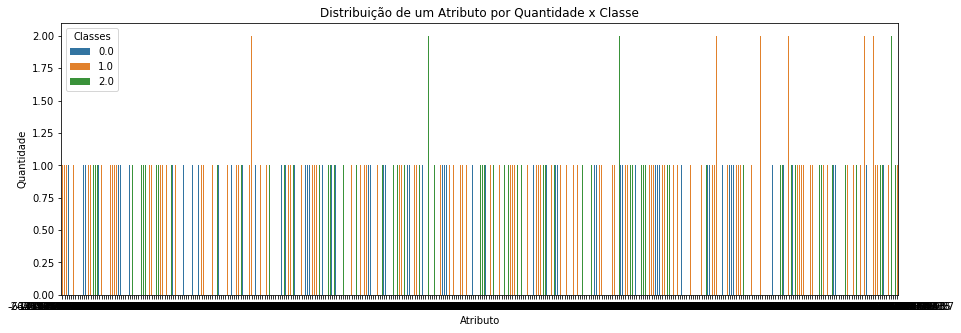

In [8]:
plt.figure(figsize=(15, 5))
ax = sns.countplot(x=3, hue=195, data=dy)
plt.xlabel('Atributo')
plt.ylabel('Quantidade')
plt.legend(loc='upper left', title='Classes')
ax.set_title('Distribuição de um Atributo por Quantidade x Classe')    

Mesmo que apenas utilizando um dos atributos de SPHARM notamos que não existe uma boa distribuição dos valores
deste atributo entre as classes.

Text(0.5, 1.0, 'Distribuição de um Atributo por Classe')

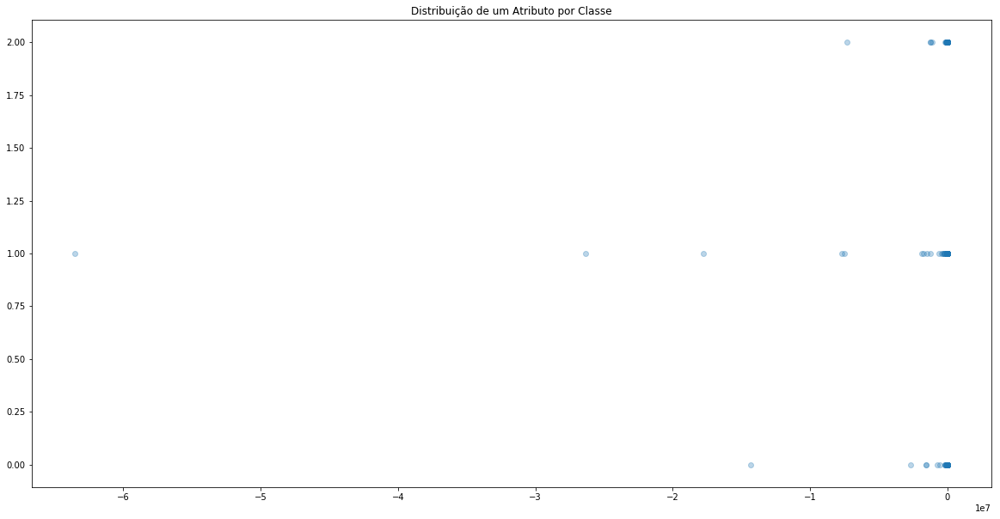

In [13]:
plt.figure(figsize=(20, 10))

ax = plt.scatter(dy[3], dy[195], alpha=.3)

plt.title('Distribuição de um Atributo por Classe')    

Nesta visibilidade podemos encontrar outliers que podem ou não serem desconsiderados para os treinamentos.

### 4) Correlação entre os Atributos e Variável Alvo

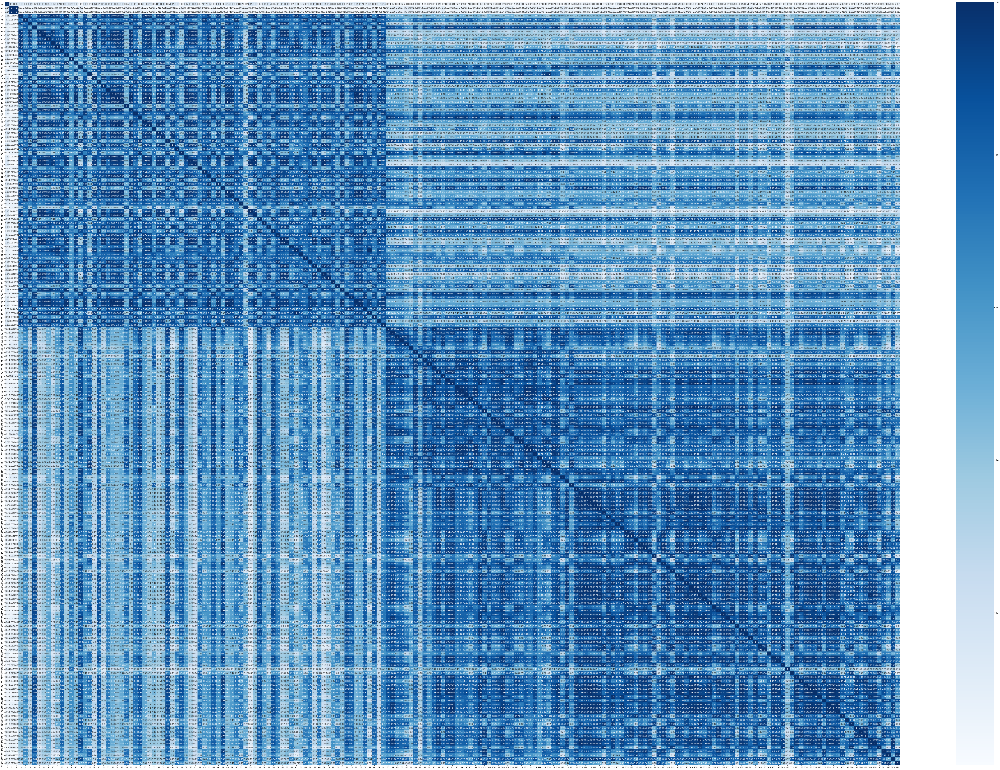

In [16]:
# Correlação entre os Atributos

dz = dy.iloc[:, 0:195]

plt.figure(figsize=(100, 70))

corr = dz.corr()
my_cols = corr.columns.to_list()

sns.heatmap(np.abs(corr.values), annot=True, cmap='Blues')

#ax.set_title('Correlação entre os atributos')
#plt.yticks(np.arange(len(my_cols)), my_cols, rotation=0)
#plt.xticks(np.arange(len(my_cols)), my_cols, rotation=90)


Podemos observar que não existe uma correlação forte entre os atributos SPHARM e a variável dependente (alvo).
Para mostrar de forma mais clara, o Gráfico a seguir seleciona somente os 20 primeiros atributos SPHARM e 
sua correlação com a variável alvo.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


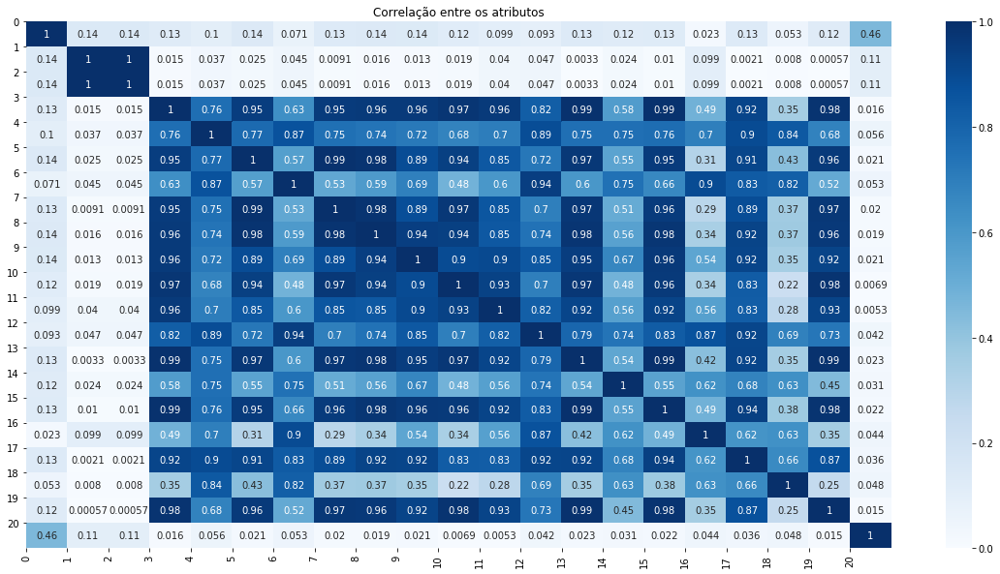

In [17]:
dz = dy.iloc[:, 0:20]
dz[20] = dy.iloc[:, 195]

plt.figure(figsize=(20, 10))

corr = dz.corr()
my_cols = corr.columns.to_list()

sns.heatmap(np.abs(corr.values), annot=True, cmap='Blues')

plt.title('Correlação entre os atributos')
plt.yticks(np.arange(len(my_cols)), my_cols, rotation=0);
plt.xticks(np.arange(len(my_cols)), my_cols, rotation=90);

A última linha e coluna corresponde a variável alvo. Repare que o valor da correlação para com as 
demais variáveis (atributos) são baixo. Não levamos em consideração a correlação com a Idade, pois no nosso
experimento a idade não poderia ser o diferencial.

## PCA

In [18]:
#Para facilitar o processamento do PCA, vamos converter os dados para o formato numpy.

dt = dy.to_numpy()

nrow, ncol = dt.shape

y = dt[:,195]
X = dt[:,:195]

### Análise descritiva dos dados
Podemos ter uma ideia da separação entre as classes realizando a projeção dos atributos em três classes usando PCA.

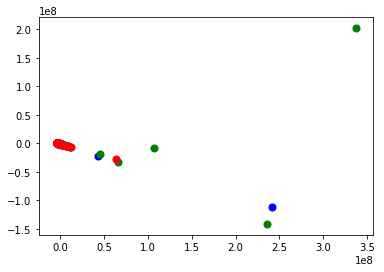

In [22]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X)

classes = np.unique(y)

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
aux = 0

for c in classes:
    if c == 0:
        lb = 'Normal'
    elif c == 1:
        lb = 'Hiper'
    else:
        lb = 'Sub'
    nodes = np.where(y == c)
    plt.scatter(pca_result[nodes,0], pca_result[nodes,1], s=50, color = colors[aux], label = lb)
    aux = aux + 1

Vemos que em duas dimensões, a separação das três classes não é clara. 

Então, vamos identificar os atributos que mais explicam a variância nos dados.

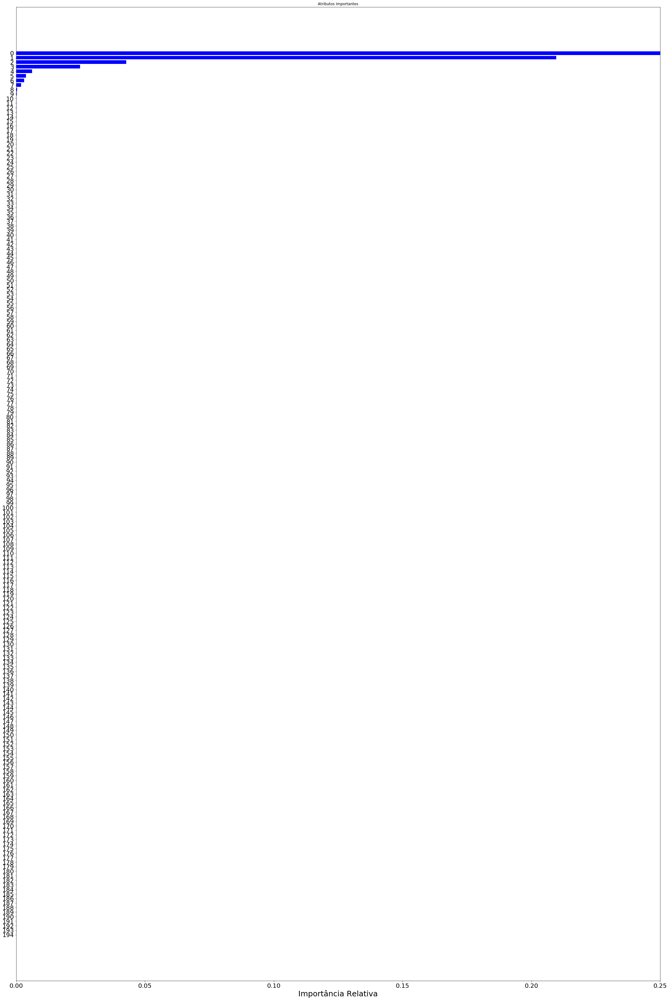

In [23]:
# Plotando a importância relativa que os atributos tiveram em relação ao PCA

pca = PCA()
pca_result = pca.fit_transform(X)
var_exp = pca.explained_variance_ratio_

importances = var_exp
attributes = list(dy.columns)
indices = np.argsort(importances)
attributes_rank = []
for i in indices:
    attributes_rank.append(attributes[i])

plt.figure(figsize=(30,45))
plt.title('Atributos Importantes')
plt.tight_layout()
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), attributes_rank, fontsize=25)
plt.xlabel('Importância Relativa',fontsize=25)
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.xlim([0.0, 0.25])
plt.show()

Se levarmos em consideração que o atributo 0 é a Idade, os atributos 2 e 3 representam o sexo, e o atributo 4 o 
primeiro atributo do SPHARM, verificamos que os atributos do SPHARM ainda não conseguem explicar a 
variável dependente (alvo).
Vamos tentar reforçar esta correlação fazendo a padronização e a normalização e verificando os efeitos sobre o PCA.

## Padronização

In [24]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(X)
X = scaler.transform(X)

print('Dados transformados:')
print('Media: ', np.mean(X, axis = 0))
print('Desvio Padrao:', np.std(X, axis = 0))

Dados transformados:
Media:  [-3.55271368e-17 -3.55271368e-17  3.55271368e-17  1.33226763e-17
  0.00000000e+00  2.44249065e-17 -1.55431223e-17 -6.66133815e-18
 -8.88178420e-18  4.44089210e-18  2.22044605e-17 -4.44089210e-18
 -6.66133815e-18 -2.66453526e-17  8.88178420e-18  2.22044605e-17
 -3.33066907e-18 -1.11022302e-17  2.22044605e-18  1.77635684e-17
  6.66133815e-18 -4.44089210e-18 -1.33226763e-17 -3.10862447e-17
  0.00000000e+00  8.88178420e-18 -1.11022302e-17 -4.44089210e-18
 -2.22044605e-17  2.22044605e-17  6.66133815e-18  2.66453526e-17
  4.88498131e-17  1.33226763e-17 -1.55431223e-17 -4.44089210e-18
  4.44089210e-18 -2.22044605e-18 -1.22124533e-17  8.88178420e-18
 -4.44089210e-18 -8.88178420e-18 -1.33226763e-17  2.88657986e-17
  2.66453526e-17  1.66533454e-17 -1.33226763e-17 -4.44089210e-18
 -8.88178420e-18  1.33226763e-17  1.11022302e-17  1.77635684e-17
  2.22044605e-18  0.00000000e+00  2.22044605e-17 -2.44249065e-17
 -4.44089210e-18 -9.99200722e-18 -1.33226763e-17 -1.11022302e

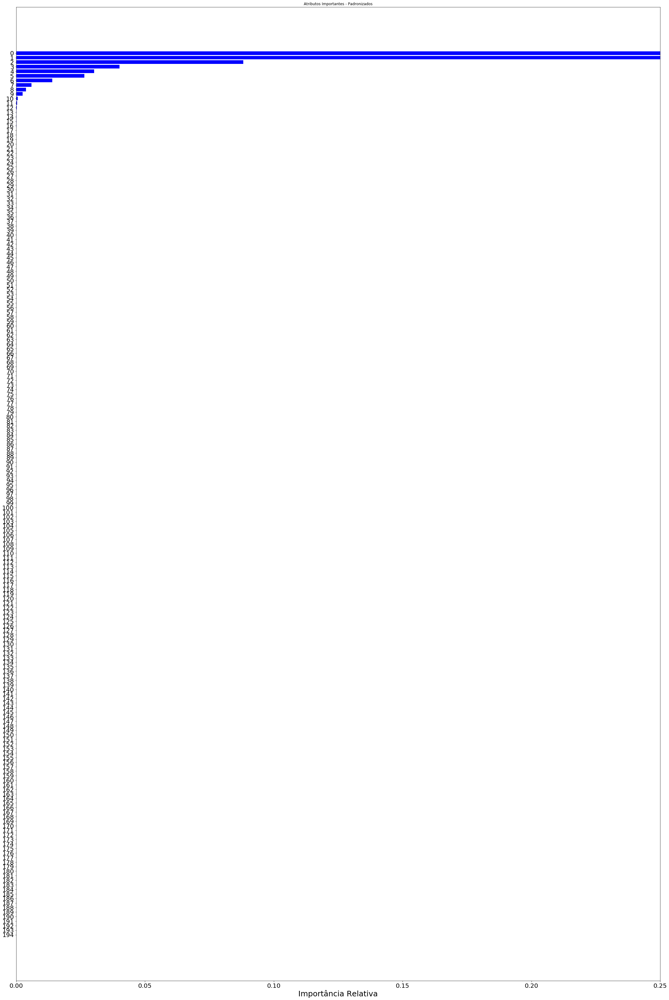

In [30]:
pca = PCA()
pca_result = pca.fit_transform(X)
var_exp = pca.explained_variance_ratio_

importances = var_exp
attributes = list(X.columns)
indices = np.argsort(importances)
attributes_rank = []
for i in indices:
    attributes_rank.append(attributes[i])

plt.figure(figsize=(30,45))
plt.title('Atributos Importantes - Padronizados')
plt.tight_layout()
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), attributes_rank, fontsize=25)
plt.xlabel('Importância Relativa',fontsize=25)
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.xlim([0.0, 0.25])
plt.show()

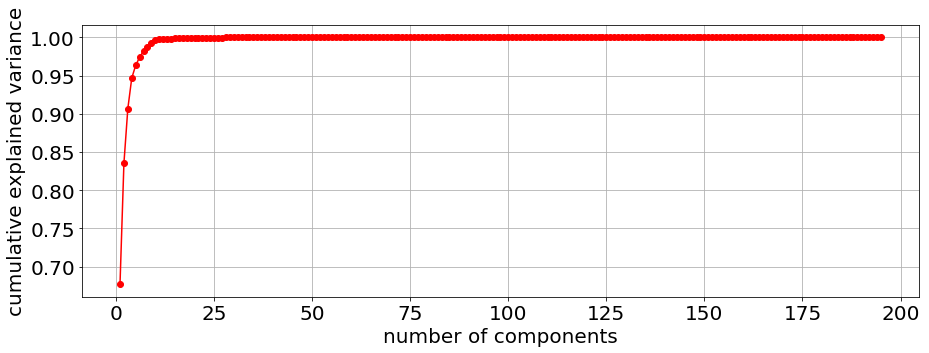

In [25]:
# Execução do PCA com os dados Padronizados
pca = PCA().fit(X)

plt.figure(figsize=(15,5))
ncomp = np.arange(1, np.shape(X)[1]+1)
plt.plot(ncomp, np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('number of components', fontsize=20)
plt.ylabel('cumulative explained variance', fontsize=20);
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.grid(True)
plt.show(True)

Mesmo com a padronização dos atributos, verificamos que o PCA considerou a Idade e o Sexo para explicar 95% da base
em relação a variável alvo.

Vamos tentar normalizar e verificar o efeito.

## Normalização dos Atributos

In [26]:
from sklearn.preprocessing import MinMaxScaler

y = dy.iloc[:,195]
X = dy.iloc[:,:195]

scaler = MinMaxScaler()
scaler.fit(X)

X.iloc[:, :] = scaler.transform(X)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


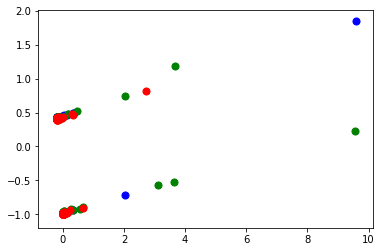

In [27]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X)

classes = np.unique(y)

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
aux = 0

for c in classes:
    if c == 0:
        lb = 'Normal'
    elif c == 1:
        lb = 'Hiper'
    else:
        lb = 'Sub'
    nodes = np.where(y == c)
    plt.scatter(pca_result[nodes,0], pca_result[nodes,1], s=50, color = colors[aux], label = lb)
    aux = aux + 1

Acreditamos que este gráfico, diferente com dados originais, é por causa da acentuação dos outliers na 
Normalização

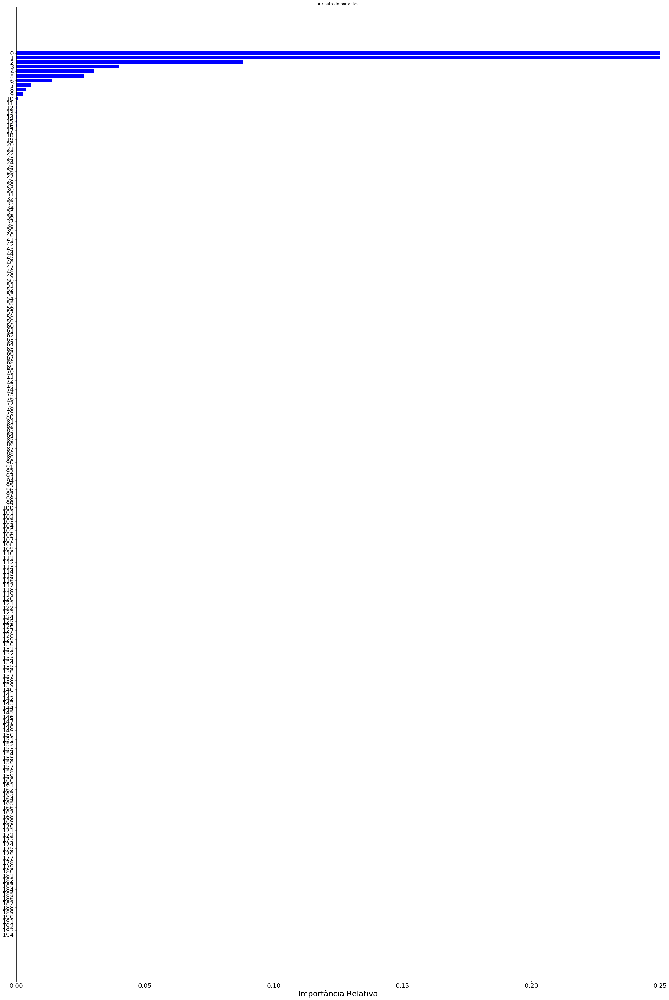

In [28]:
pca = PCA()
pca_result = pca.fit_transform(X)
var_exp = pca.explained_variance_ratio_

importances = var_exp
attributes = list(X.columns)
indices = np.argsort(importances)
attributes_rank = []
for i in indices:
    attributes_rank.append(attributes[i])

plt.figure(figsize=(30,45))
plt.title('Atributos Importantes')
plt.tight_layout()
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), attributes_rank, fontsize=25)
plt.xlabel('Importância Relativa',fontsize=25)
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.xlim([0.0, 0.25])
plt.show()

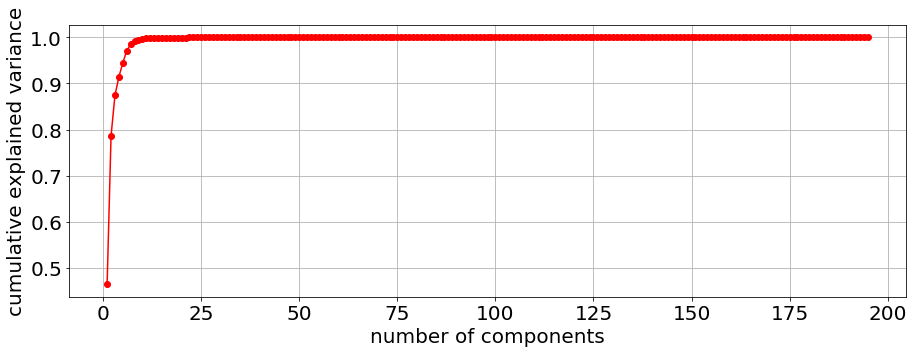

In [29]:
# Execução do PCA com os dados Padronizados
pca = PCA().fit(X)

plt.figure(figsize=(15,5))
ncomp = np.arange(1, np.shape(X)[1]+1)
plt.plot(ncomp, np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('number of components', fontsize=20)
plt.ylabel('cumulative explained variance', fontsize=20);
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.grid(True)
plt.show(True)

Conseguimos uma pequena evolução com a consideração de mais 4 atributos SPHARM, em relação a 
aplicação da padronização, para explicação da variável alvo, mas sem importância.

## Estudo de Alternativas para o PCA
Entendemos que os atributos Idade e sexo poderiam ser excluídos da base e somente os atributos
SPHARM deveriam ser comparados.

In [31]:
# Desconsiderando os atributos de idade e sexo
dt = dy.to_numpy()

nrow, ncol = dt.shape

ya = dt[:,195]
Xa = dt[:,3:195]    #desconsiderando os atributos de Idade e Sexo (colunas 0, 1 e 2)

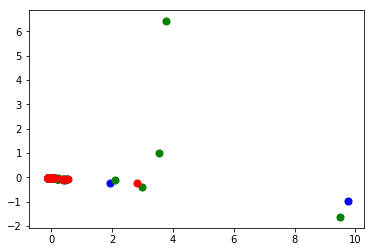

In [33]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(Xa)

classes = np.unique(ya)

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
aux = 0

for c in classes:
    if c == 0:
        lb = 'Normal'
    elif c == 1:
        lb = 'Hiper'
    else:
        lb = 'Sub'
    nodes = np.where(ya == c)
    plt.scatter(pca_result[nodes,0], pca_result[nodes,1], s=50, color = colors[aux], label = lb)
    aux = aux + 1

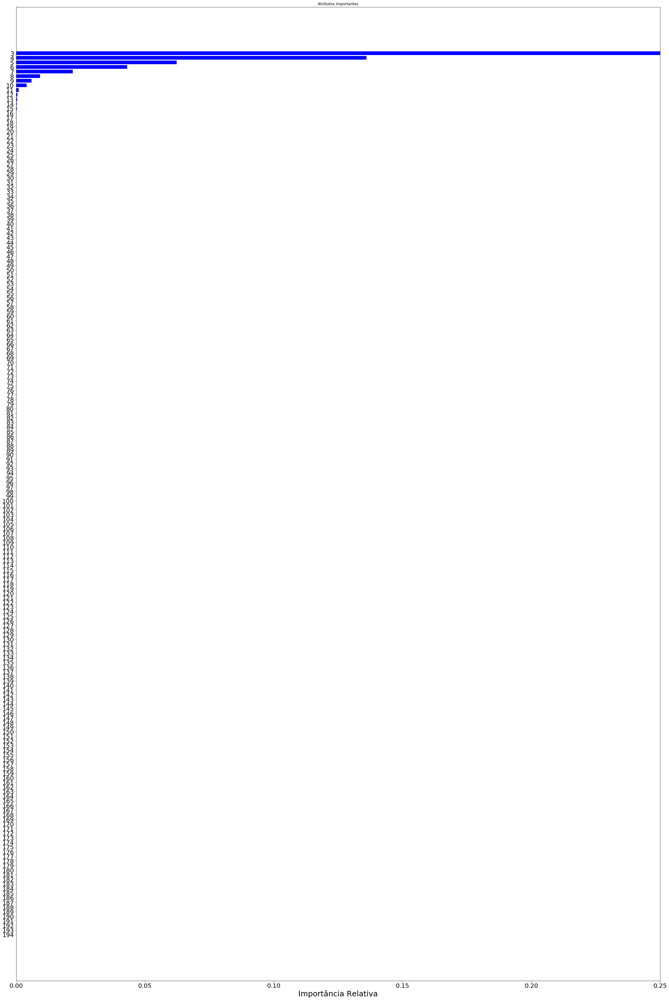

In [34]:
# Plotando a importância relativa que os atributos tiveram em relação ao PCA

pca = PCA()
pca_result = pca.fit_transform(Xa)
var_exp = pca.explained_variance_ratio_

importances = var_exp
attributes = list(dy.columns)[3:]
indices = np.argsort(importances)
attributes_rank = []
for i in indices:
    attributes_rank.append(attributes[i])

plt.figure(figsize=(30,45))
plt.title('Atributos Importantes')
plt.tight_layout()
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), attributes_rank, fontsize=25)
plt.xlabel('Importância Relativa',fontsize=25)
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.xlim([0.0, 0.25])
plt.show()

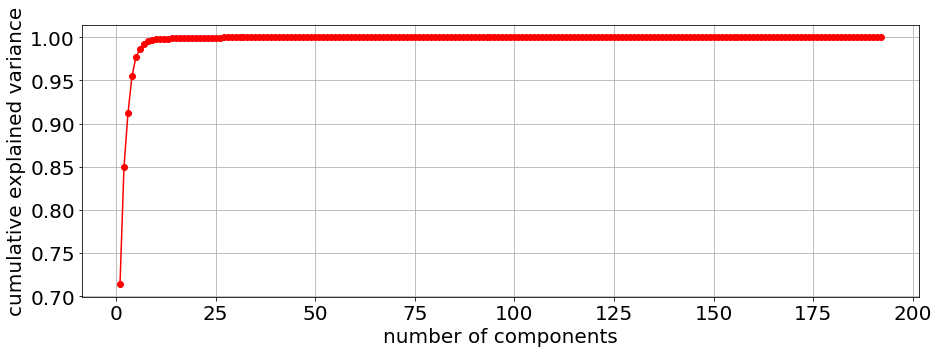

In [35]:
# Execução do PCA com os dados Padronizados
pca = PCA().fit(Xa)

plt.figure(figsize=(15,5))
ncomp = np.arange(1, np.shape(Xa)[1]+1)
plt.plot(ncomp, np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('number of components', fontsize=20)
plt.ylabel('cumulative explained variance', fontsize=20);
plt.xticks(color='k', size=20)
plt.yticks(color='k', size=20)
plt.grid(True)
plt.show(True)

## Análise Final
Desconsiderando os atributos de Idade e Sexo, conseguimos uma maior representatividade dos três primeiros atributos SPHARM,
mas não garante que a correção seja mais forte com a variável alvo.

Um dos desafios é buscar, dentro da técnica SPHARM, o que poderemos aplicar para reforçar ou combinar estes conteúdos
de tal maneira que a correlação com a variável alvo seja mais forte.